In [1]:
import os
from pathlib import Path

import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import tifffile
from skimage.segmentation import find_boundaries
from skimage.transform import resize

In [2]:
%load_ext autoreload

In [3]:
%autoreload 2

In [4]:
import mip.utils as utils
from mip.gating import gate_region

Loading BokehJS ...

## load in data

In [72]:
# sample = 'HT323B1-H3'
# sample = 'HT339B1-H4A4'
# sample = 'HT397B1-H3A1'
# sample = 'HT206B1-H1'
sample = 'HT323B1-H1-08042022'
root = '/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca'
fp = os.path.join(root, sample, 'level_4', 'spatial_features.h5ad')

In [73]:
Path(os.path.join(root, sample, 'level_4', 'annotation_plots')).mkdir(parents=True, exist_ok=True)
sc.settings.figdir = os.path.join(root, sample, 'level_4', 'annotation_plots')

In [78]:
adata = sc.read_h5ad(fp)
adata

AnnData object with n_obs × n_vars = 108628 × 27
    obs: 'area', 'perimeter', 'bbox_row_min', 'bbox_col_min', 'bbox_row_max', 'bbox_col_max', 'centroid_row', 'centroid_col', 'eccentricity', 'DAPI intensity max', 'CD31 intensity max', 'E-cadherin intensity max', 'CD4 intensity max', 'CD20-Akoya intensity max', 'Ki67 intensity max', 'CD68 intensity max', 'Pan-CK intensity max', 'CD8 intensity max', 'Histone H3 Pho intensity max', 'CD163 intensity max', 'Podoplanin intensity max', 'CD3e intensity max', 'CD36 intensity max', 'ER intensity max', 'GLUT1 intensity max', 'SMA intensity max', 'CK19 intensity max', 'MGP intensity max', 'Vimentin intensity max', 'PR intensity max', 'Foxp3 intensity max', 'CK17 intensity max', 'cKIT intensity max', 'HLA-DR intensity max', 'CK14 intensity max', 'CD11c intensity max', 'DAPI intensity min', 'CD31 intensity min', 'E-cadherin intensity min', 'CD4 intensity min', 'CD20-Akoya intensity min', 'Ki67 intensity min', 'CD68 intensity min', 'Pan-CK intensity 

In [79]:
# if we have an exclusion region
mask = tifffile.imread(os.path.join(root, sample, 'level_3', 'annotations', 'exclude.tif'))
to_include = []
for cid, r, c in zip(adata.obs.index, adata.obs['centroid_row'], adata.obs['centroid_col']):
    if mask[int(r), int(c)] == 0:
        to_include.append(cid)
adata = adata[to_include]
adata

View of AnnData object with n_obs × n_vars = 79624 × 27
    obs: 'area', 'perimeter', 'bbox_row_min', 'bbox_col_min', 'bbox_row_max', 'bbox_col_max', 'centroid_row', 'centroid_col', 'eccentricity', 'DAPI intensity max', 'CD31 intensity max', 'E-cadherin intensity max', 'CD4 intensity max', 'CD20-Akoya intensity max', 'Ki67 intensity max', 'CD68 intensity max', 'Pan-CK intensity max', 'CD8 intensity max', 'Histone H3 Pho intensity max', 'CD163 intensity max', 'Podoplanin intensity max', 'CD3e intensity max', 'CD36 intensity max', 'ER intensity max', 'GLUT1 intensity max', 'SMA intensity max', 'CK19 intensity max', 'MGP intensity max', 'Vimentin intensity max', 'PR intensity max', 'Foxp3 intensity max', 'CK17 intensity max', 'cKIT intensity max', 'HLA-DR intensity max', 'CK14 intensity max', 'CD11c intensity max', 'DAPI intensity min', 'CD31 intensity min', 'E-cadherin intensity min', 'CD4 intensity min', 'CD20-Akoya intensity min', 'Ki67 intensity min', 'CD68 intensity min', 'Pan-CK int

/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


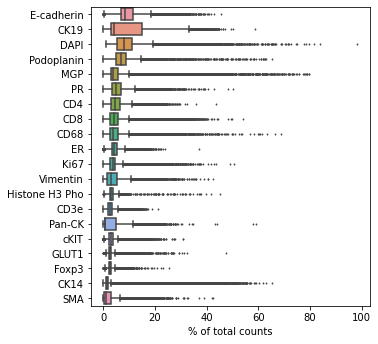

In [80]:
sc.pl.highest_expr_genes(adata, n_top=20, )

In [81]:
sc.pp.log1p(adata)

In [82]:
adata.var.index.to_list()

['DAPI',
 'CD31',
 'E-cadherin',
 'CD4',
 'CD20-Akoya',
 'Ki67',
 'CD68',
 'Pan-CK',
 'CD8',
 'Histone H3 Pho',
 'CD163',
 'Podoplanin',
 'CD3e',
 'CD36',
 'ER',
 'GLUT1',
 'SMA',
 'CK19',
 'MGP',
 'Vimentin',
 'PR',
 'Foxp3',
 'CK17',
 'cKIT',
 'HLA-DR',
 'CK14',
 'CD11c']

In [83]:
adata.raw = adata

In [84]:
annotation_marker_map = {
    'Endothelial': ['CD31'],
    'Epithelial': ['E-cadherin', 'Pan-CK'],
#     'B cell': ['CD20'],
    'Macrophage': ['CD68', 'CD163'],
#     'DC': ['CD11c'],
#     'T cell': ['CD3', 'CD4', 'CD8', 'CD45RO', 'Foxp3'],
    'T cell': ['CD3e', 'CD4', 'CD8'],
#     'Fibroblast/Myo': ['Podoplanin', 'SMA', 'Vimentin'],
    'Fibroblast/Myo': ['SMA', 'Vimentin'],
}
annotation_markers = [v for k, vs in annotation_marker_map.items() for v in vs]

In [85]:
# I've found it helpful to limit to markers only used in annotation
# This helps keep the clusters cleaner
adata = adata[:, annotation_markers]
adata

View of AnnData object with n_obs × n_vars = 79624 × 10
    obs: 'area', 'perimeter', 'bbox_row_min', 'bbox_col_min', 'bbox_row_max', 'bbox_col_max', 'centroid_row', 'centroid_col', 'eccentricity', 'DAPI intensity max', 'CD31 intensity max', 'E-cadherin intensity max', 'CD4 intensity max', 'CD20-Akoya intensity max', 'Ki67 intensity max', 'CD68 intensity max', 'Pan-CK intensity max', 'CD8 intensity max', 'Histone H3 Pho intensity max', 'CD163 intensity max', 'Podoplanin intensity max', 'CD3e intensity max', 'CD36 intensity max', 'ER intensity max', 'GLUT1 intensity max', 'SMA intensity max', 'CK19 intensity max', 'MGP intensity max', 'Vimentin intensity max', 'PR intensity max', 'Foxp3 intensity max', 'CK17 intensity max', 'cKIT intensity max', 'HLA-DR intensity max', 'CK14 intensity max', 'CD11c intensity max', 'DAPI intensity min', 'CD31 intensity min', 'E-cadherin intensity min', 'CD4 intensity min', 'CD20-Akoya intensity min', 'Ki67 intensity min', 'CD68 intensity min', 'Pan-CK int

In [86]:
sc.pp.neighbors(adata, n_neighbors=15)

In [87]:
sc.tl.umap(adata)

In [88]:
sc.tl.leiden(adata, resolution=2.)

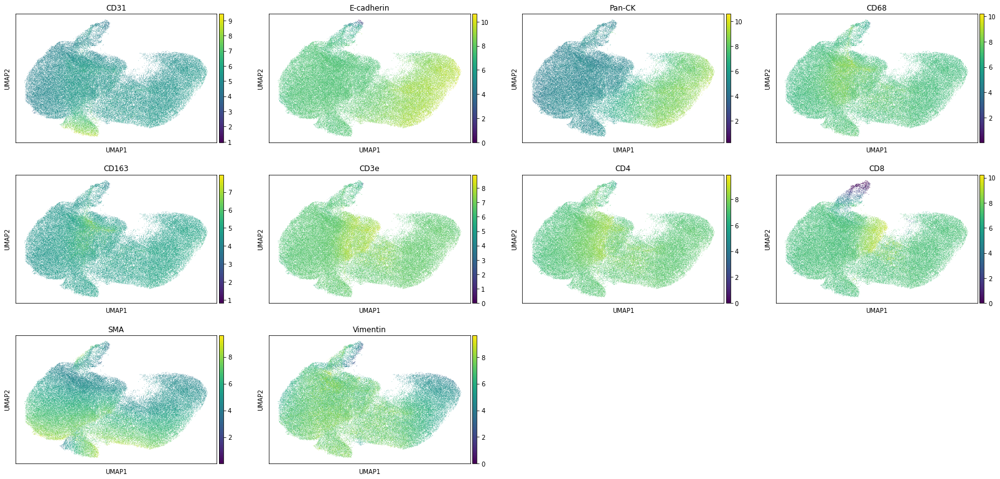

In [89]:
sc.pl.umap(adata, color=annotation_markers, save='marker_overlays.png')

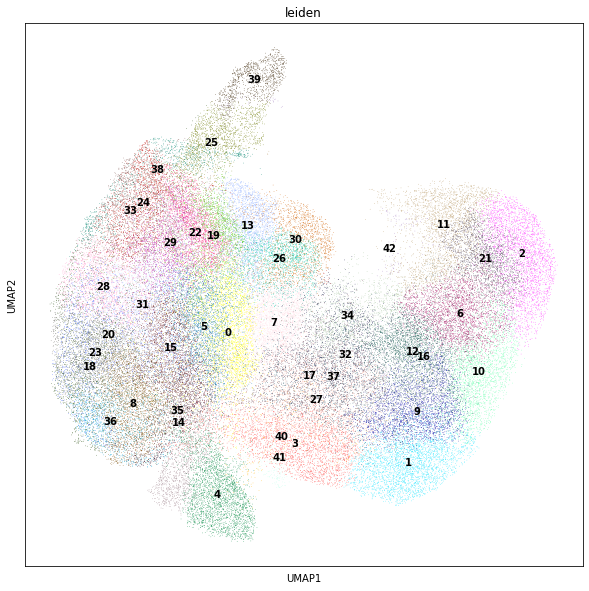

In [90]:
fig, ax = plt.subplots(figsize=(10, 10))
sc.pl.umap(adata, color=['leiden'], legend_loc='on data', ax=ax, save='leiden.png')

In [93]:
cluster_map = {
    'B cell': [],
    'Endothelial': [4, 14],
    'Epithelial': [11, 42, 21, 2, 6, 12, 16, 10, 9, 1, 41, 40, 3, 27, 37, 32, 34, 17],
    'CD8 T cell': [30, 26, 7],
    'CD4 T cell': [0, 13],
    'Macrophage': [35, 15, 5, 19, 22, 29, 31],
    'Stroma': [8, 36, 18, 23, 20, 28, 33, 24, 38, 25, 39],
}

r = {str(v):k for k, vs in cluster_map.items() for v in vs}
adata.obs['cell_type_general'] = [r.get(l, l)
                          for l in adata.obs['leiden']]

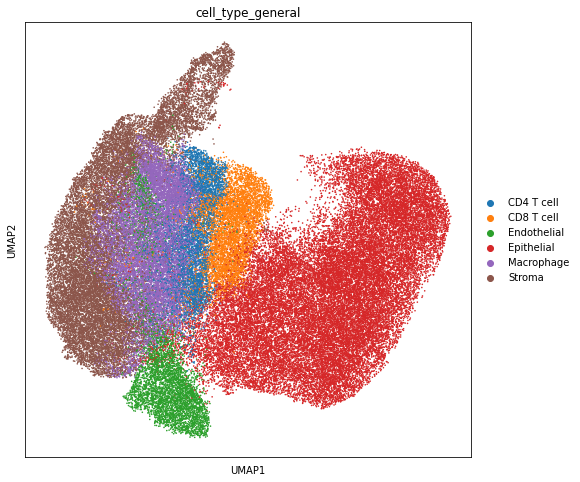

In [94]:
fig, ax = plt.subplots(figsize=(8, 8))
sc.pl.umap(adata, color=['cell_type_general'], ncols=1, s=10, save='ungated_umap.png', ax=ax)

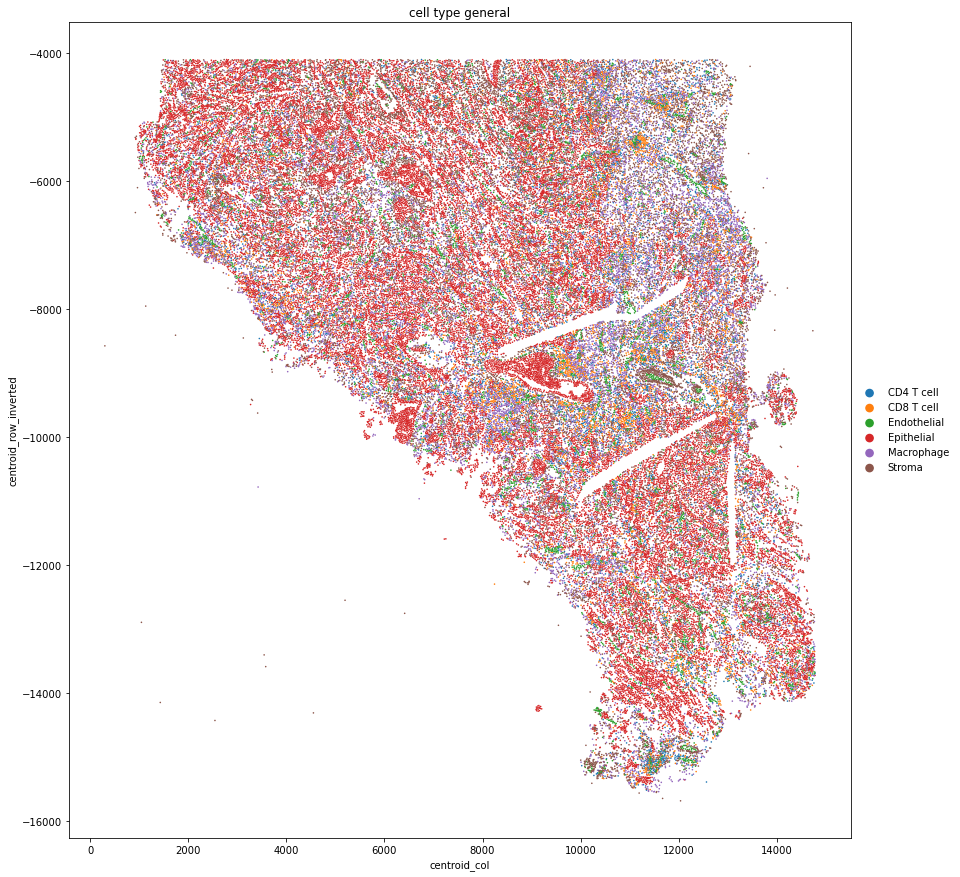

In [95]:
adata.obs['centroid_row_inverted'] = [-x for x in adata.obs['centroid_row']]
fig, ax = plt.subplots(
    figsize=(int(max(adata.obs['centroid_col']) / 1000), int(max(adata.obs['centroid_row']) / 1000)))
sc.pl.scatter(adata, x='centroid_col', y='centroid_row_inverted', color='cell_type_general', ax=ax, size=10,
             save='ungated_mapped.png')

In [96]:
adata.write_h5ad(os.path.join(root, sample, 'level_4', 'cell_annotation_macro.h5ad'))

In [97]:
# adata = sc.read_h5ad(os.path.join(root, sample, 'level_4', 'cell_annotation_macro.h5ad'))

#### qitissue cluster file

In [98]:
df = adata.obs[['cell_type_general']]
df.index.name = 'CellID'
df.columns = ['Cluster']

m = {
    'B cell': '1',
    'CD8 T cell': '2',
    'CD4 T cell': '3',
    'Endothelial': '4',
    'Epithelial': '5',
    'Macrophage': '6',
    'Stroma': '7',
}

df['label'] = df['Cluster'].to_list()
df['Cluster'] = [m[x] for x in df['Cluster']]

df.to_csv(os.path.join(root, sample, 'level_4', 'cell_annotation_macro.csv'))

/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app
/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [99]:
os.path.join(root, sample, 'level_4', 'cell_annotation_macro.csv')

'/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/HT323B1-H1-08042022/level_4/cell_annotation_macro.csv'

In [100]:
df

,Cluster,label
CellID,,
27107,5,Epithelial
27136,7,Stroma
27140,5,Epithelial
27146,5,Epithelial
27149,5,Epithelial
...,...,...
108624,6,Macrophage
108625,7,Stroma
108626,7,Stroma


#### import qitissue gates

In [101]:

df = pd.read_csv(os.path.join(root, sample, 'level_3', 'qitissue', 'QiGates.csv'),
                index_col=0)
df


,X-Range 1,X-Range 2,CD8 T cell,X-Range 2.1,CD4 T cell,X-Range 2.2,Endothelial,Myoepithelial,Quadrant 2,Myoepithelial.1,...,Tumor,X-Range 1.1,X-Range 1.2,X-Range 2.3,Macrophage - M2,Macrophage - M1,Fibroblast,Noise,Fibroblast.1,Fibroblast.2
Cell,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108624,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
108625,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
108626,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [102]:
exclude = {'X-Range 1', 'X-Range 2', 'Quadrant 1', 'Quadrant 2', 'Quadrant 3', 'Quandrant 4'}
idxs = [c.split('.')[0] for c in df.columns]
df_t = df.transpose()
df_t['gate'] = list(idxs)
df_t = df_t.groupby('gate').sum()
df_t = df_t.loc[[x for x in df_t.index if x not in exclude]]
df = df_t.transpose()
df

gate,CD4 T cell,CD8 T cell,Endothelial,Fibroblast,Macrophage - M1,Macrophage - M2,Myoepithelial,Noise,Tumor
Cell,,,,,,,,,
1,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
108624,0,0,0,1,0,0,0,0,0
108625,0,0,0,0,0,0,0,1,0
108626,0,0,0,0,0,0,0,1,0


In [103]:
# some gates very slightly overlap resulting in two classifications for a cell
# dealing with that here
# order of ops
order = ['B cell', 'CD4 T cell', 'CD8 T cell', 'Endothelial', 'Macrophage - M1', 'Macrophage - M2',
         'Myoepithelial', 'Tumor', 'Treg', 'DC', 'Fibroblast', 'Noise']
sort_order = {o:i for i, o in enumerate(order)}
for i in df.index.to_list():
    if df.loc[i].sum() > 1:
        val = sorted(df.columns[df.loc[i]==1], key=lambda x: sort_order[x])[0]
        df.loc[i] = [1 if c == val else 0 for c in df.columns]
    elif df.loc[i].sum() < 1:
        df.loc[i] = [1 if c == 'Noise' else 0 for c in df.columns]
df  

gate,CD4 T cell,CD8 T cell,Endothelial,Fibroblast,Macrophage - M1,Macrophage - M2,Myoepithelial,Noise,Tumor
Cell,,,,,,,,,
1,0,0,0,0,0,0,0,1,0
2,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,1,0
5,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...
108624,0,0,0,1,0,0,0,0,0
108625,0,0,0,0,0,0,0,1,0
108626,0,0,0,0,0,0,0,1,0


In [104]:
df.to_csv(os.path.join(root, sample, 'level_3', 'qitissue', 'QiGates_cleaned.csv'))

In [105]:
np.argwhere(df.values).shape

(108628, 2)

In [106]:
cell_to_type = {i:df.columns[df.loc[i]==1][0]
               for i in df.index.to_list()}

In [107]:
adata.obs['cell_type'] = [cell_to_type[int(i)] for i in adata.obs.index.to_list()]

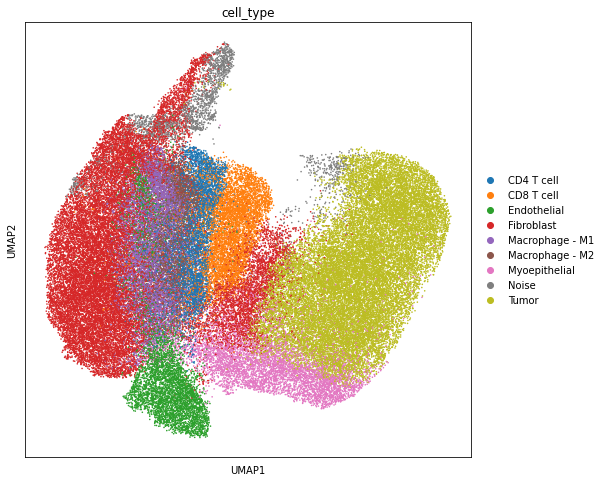

In [108]:
fig, ax = plt.subplots(figsize=(8, 8))
sc.pl.umap(adata, color=['cell_type'], ncols=1, s=10, ax=ax,
          save='final_umap.png')

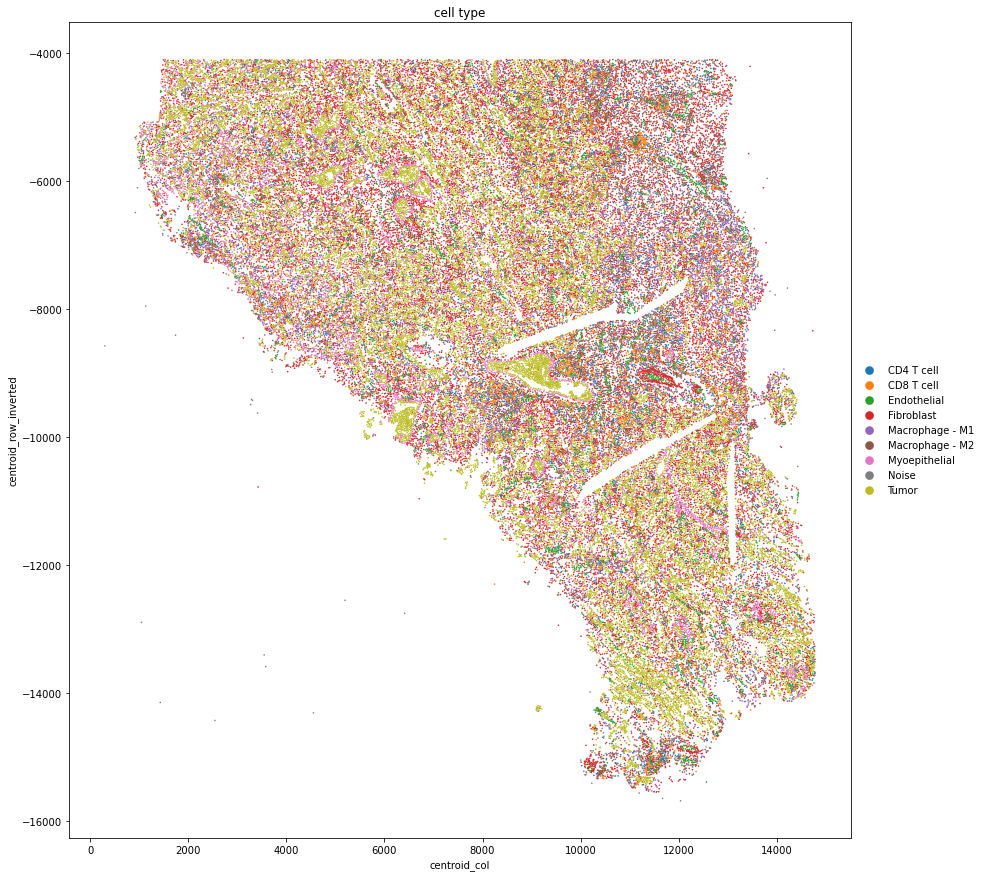

In [109]:
fig, ax = plt.subplots(
    figsize=(int(max(adata.obs['centroid_col']) / 1000), int(max(adata.obs['centroid_row']) / 1000)))
sc.pl.scatter(adata, x='centroid_col', y='centroid_row_inverted', color='cell_type', size=10, ax=ax,
              save='final_mapped.png')

In [110]:
adata.write_h5ad(os.path.join(root, sample, 'level_4', 'cell_annotation_macro.h5ad'))

In [6]:
# adata = sc.read_h5ad(os.path.join(root, sample, 'level_4', 'cell_annotation_macro.h5ad'))

#### adjust cell typing thresholds

In [7]:
def plot_channel_dist(adata, channel, n=5000, cell_type=None):
    if cell_type is not None:
        f = adata[adata.obs['cell_type']==cell_type]
    else:
        f = adata
    idxs = np.random.choice(np.arange(f.shape[0]), replace=False, size=n)
    f = f[idxs]
    xs = f[:, channel].X.flatten()
    sns.distplot(xs)
    

/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


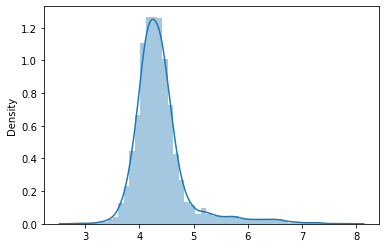

In [8]:
plot_channel_dist(adata, 'CD31')

/diskmnt/Projects/Users/estorrs/miniconda3/envs/squidpy/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


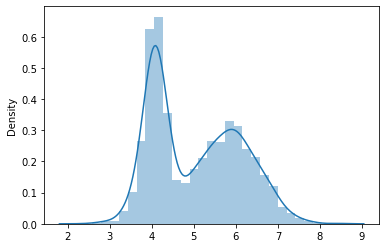

In [9]:
plot_channel_dist(adata, 'CD31', cell_type='Noise')

In [10]:
thresh = 4.6

In [11]:
adata.obs['qitissue_gated_cell_type'] = adata.obs['cell_type'].to_list()

In [12]:
adata.obs['revised_cell_type'] = [
    'Endothelial' if ct == 'Noise' and x >= thresh else ct
    for ct, x in zip(adata.obs['cell_type'], adata[:, 'CD31'].X.flatten())]

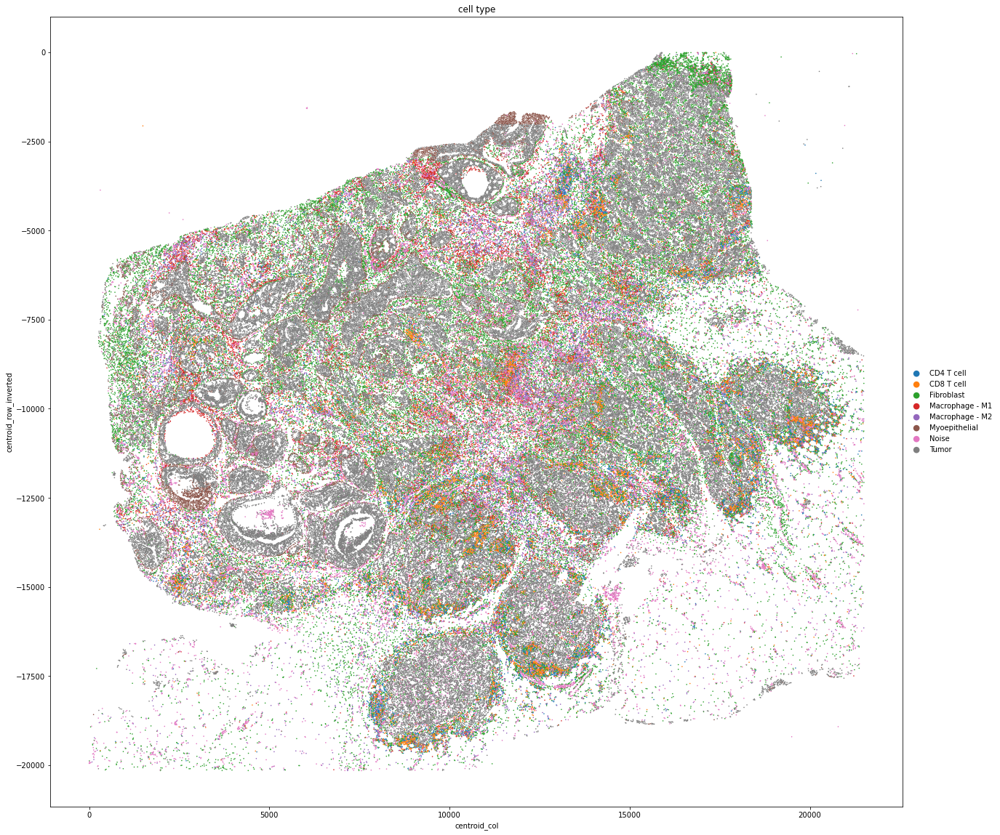

In [13]:
fig, ax = plt.subplots(
    figsize=(int(max(adata.obs['centroid_col']) / 1000), int(max(adata.obs['centroid_row']) / 1000)))
sc.pl.scatter(adata, x='centroid_col', y='centroid_row_inverted', color='cell_type', size=10, ax=ax)

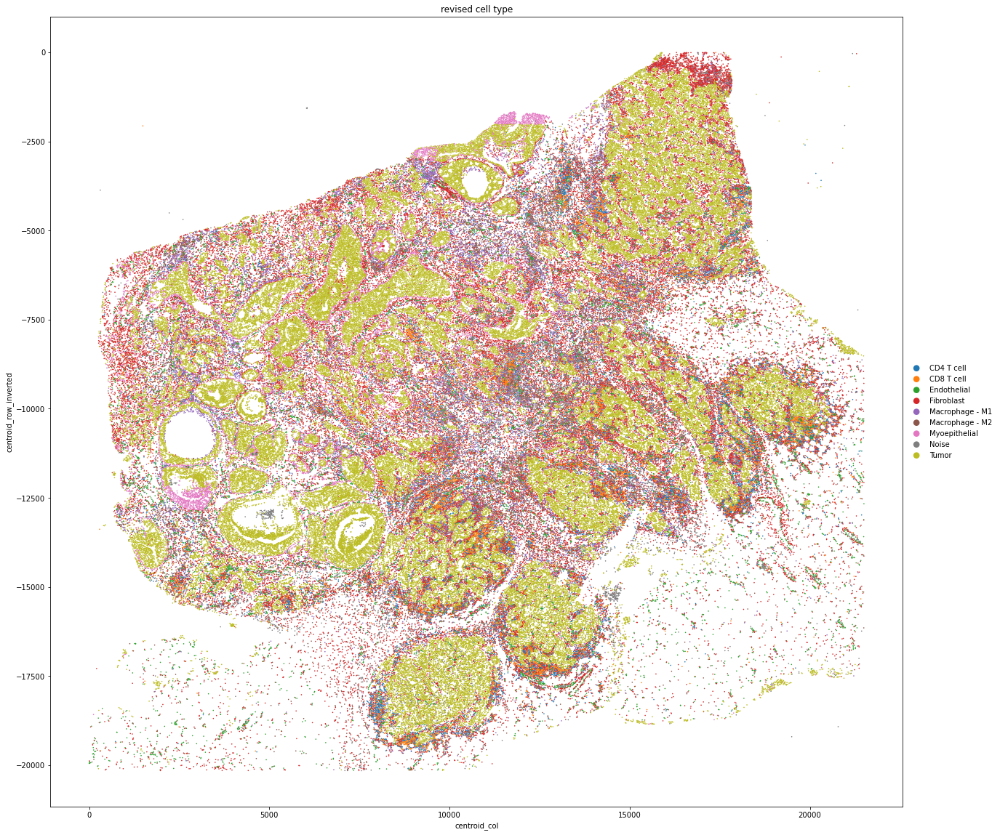

In [14]:
fig, ax = plt.subplots(
    figsize=(int(max(adata.obs['centroid_col']) / 1000), int(max(adata.obs['centroid_row']) / 1000)))
sc.pl.scatter(adata, x='centroid_col', y='centroid_row_inverted', color='revised_cell_type', size=10, ax=ax)

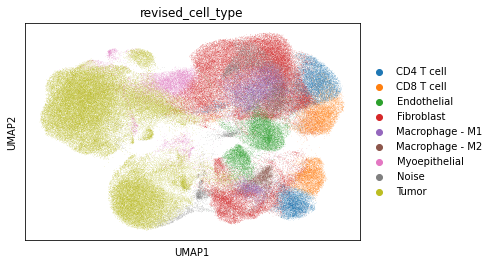

In [15]:
sc.pl.umap(adata, color='revised_cell_type')

In [16]:
adata.obs['cell_type'] = adata.obs['revised_cell_type'].to_list()

In [17]:
adata.write_h5ad(os.path.join(root, sample, 'level_4', 'cell_annotation_macro.h5ad'))

#### save qitissue gate thresholds

In [51]:
# d = {
#     'B cell': {
#         'CD20': 2630.,
#     },
#     'CD8 T cell': {
#         'CD3': 995.,
#         'CD8': 1860.,
#     },
#     'CD4 T cell': {
#         'CD3': 995.,
#         'CD4': 1900.,
#     },
#     'Treg': {
#         'CD3': 995.,
#         'CD4': 1990.,
#         'Foxp3': 1950.,
#     },
#     'DC': {
#         'CD68': 1880.,
#         'CD11c': 980.,
#         'HLA-DR': 2260.,
#     },
#     'Macrophage - M1': {
#         'CD68': 1880.,
#     },
#     'Macrophage - M2': {
#         'CD68': 1880.,
#         'CD163': 2800.
#     },
#     'Endothelial': {
#         'CD31': 290.
#     },
#     'Epithelial': {
#         'Pan-CK': 1875.
#     },
#     'Myoepithelial': {
#         'Pan-CK cluster': '',
#         'SMA or': 1200.,
#         'Podoplanin or': 1260.,
#     },
#     'Fibroblast': {
#         'Negative all other': '',
#         'SMA': 1380.,
#         'Vimentin': 2690.
#     },
# }

# json.dump(d, open(f'/diskmnt/Projects/Users/estorrs/multiplex_data/codex/htan/brca/{sample}/level_3/qitissue/QiGates_thresholds.json', 'w'))


In [42]:
1

1